In [1]:
import pandas as pd
import numpy as np
from functions import *
# visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import mitosheet
import plotly.express as px
#stats
from scipy.stats import chi2_contingency
from scipy.stats import f_oneway, levene, shapiro, kruskal, mannwhitneyu, ttest_ind
#preprocessing
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer


#reduction de diomention
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [2]:
data = pd.read_csv('data/dataEnriched.csv')
data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,ANNUITY_SUM_ALL,ANNUITY_GOODS_SUM_ALL,AMT_CREDIT_HOUR_PROCESS_START_MEAN_ALL,AMT_CREDIT_HOUR_PROCESS_START_SUM_ALL,AMT_CREDIT_NFLAG_LAST_APPL_DAY_MEAN_ALL,AMT_CREDIT_NFLAG_LAST_APPL_DAY_MAX_ALL,AMT_CREDIT_YIELD_GROUP_MEAN_ALL,AMT_CREDIT_YIELD_GROUP_SUM_ALL,AMT_CREDIT_YIELD_GROUP_MIN_ALL,AMT_INTEREST_SUM_ALL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,7.460622e+03,7.460622e+03,1611495.00,1611495.0,179055.00,179055.0,358110.00,358110.0,358110.0,42987.60
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,1.501007e+05,1.369840e+05,6459408.00,19378224.0,484191.00,1035882.0,1107279.00,3321837.0,204160.5,195964.65
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,5.026487e+03,6.070485e+03,100530.00,100530.0,20106.00,20106.0,60318.00,60318.0,60318.0,1323.00
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,2.700008e+10,2.700008e+10,4214934.00,37934406.0,291695.50,906615.0,692621.00,6233589.0,0.0,1205267.76
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,4.935926e+04,4.617637e+04,1935207.75,11611246.5,166638.75,284400.0,537462.75,3224776.5,58464.0,640477.62


In [3]:
data['TARGET'] = data['TARGET'].astype('object')

In [4]:
colCat = data.select_dtypes(include = 'object')

In [5]:
colCat.columns

Index(['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE',
       'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE',
       'EMERGENCYSTATE_MODE'],
      dtype='object')

In [6]:
colName = ['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE',
       'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE',
       'EMERGENCYSTATE_MODE']
for col in colName:
    print(data[col].value_counts())

0    282682
1     24825
Name: TARGET, dtype: int64
Cash loans         278232
Revolving loans     29275
Name: NAME_CONTRACT_TYPE, dtype: int64
F    202448
M    105059
Name: CODE_GENDER, dtype: int64
N    202922
Y    104585
Name: FLAG_OWN_CAR, dtype: int64
Y    213308
N     94199
Name: FLAG_OWN_REALTY, dtype: int64
Unaccompanied      248523
Family              40148
Spouse, partner     11370
Children             3267
Other_B              1770
XNA                  1292
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64
Working                 158771
Commercial associate     71616
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64
Secondary / secondary special    218389
Higher education                  74862
Incomplete higher                 10276
Lower secondary                    3

In [7]:
# Sélectionner les colonnes d'intérêt
colName = ['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE',
       'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE',
       'EMERGENCYSTATE_MODE']
# Créer un DataFrame avec seulement les colonnes d'intérêt
data_sub = data[colName]

# Liste des colonnes catégorielles
cat_columns = ['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE',
       'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE',
       'EMERGENCYSTATE_MODE']

# Réaliser le test du Chi-deux pour chaque colonne catégorielle
for col in cat_columns:
    contingency_table = pd.crosstab(data_sub[col], data_sub['TARGET'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Relation entre {col} et la TARGET :")
    print(f"Statistique Chi-deux : {chi2}")
    print(f"p-value : {p}")
    print(f"Degrés de liberté : {dof}")
    print("Fréquences attendues :")
    print(expected)
    print("\n")


Relation entre TARGET et la TARGET :
Statistique Chi-deux : 307493.5253391637
p-value : 0.0
Degrés de liberté : 1
Fréquences attendues :
[[259861.11901192  22820.88098808]
 [ 22820.88098808   2004.11901192]]


Relation entre NAME_CONTRACT_TYPE et la TARGET :
Statistique Chi-deux : 292.95767617018174
p-value : 1.1274999190439246e-65
Degrés de liberté : 1
Fréquences attendues :
[[255770.36693148  22461.63306852]
 [ 26911.63306852   2363.36693148]]


Relation entre CODE_GENDER et la TARGET :
Statistique Chi-deux : 920.0057254249849
p-value : 4.394091339983112e-202
Degrés de liberté : 1
Fréquences attendues :
[[186104.39936652  16343.60063348]
 [ 96577.60063348   8481.39936652]]


Relation entre FLAG_OWN_CAR et la TARGET :
Statistique Chi-deux : 146.63914697498637
p-value : 9.410574445435375e-34
Degrés de liberté : 1
Fréquences attendues :
[[186540.13340835  16381.86659165]
 [ 96141.86659165   8443.13340835]]


Relation entre FLAG_OWN_REALTY et la TARGET :
Statistique Chi-deux : 11.5660924

une p_value faible (>5%) signifie que la target et la variable categorielle ne sont pas independantes
nous allons donc par la suite supprimer les variables avec des p_value depassant le seuil des 5%

In [8]:
# Sélectionner les colonnes numériques
numerical_columns = data.select_dtypes(exclude=['object']).columns

# Séparer les données en deux groupes selon la TARGET
group1 = data[data['TARGET'] == 0]
group2 = data[data['TARGET'] == 1] 

# Vérifier les conditions pour l'utilisation de l'ANOVA
def check_anova_conditions(group1, group2, numerical_column):
    # Vérifier l'homogénéité des variances
    levene_stat, levene_pvalue = levene(group1[numerical_column], group2[numerical_column])
    
    # Vérifier la normalité des résidus
    shapiro_stat_group1, shapiro_pvalue_group1 = shapiro(group1[numerical_column])
    shapiro_stat_group2, shapiro_pvalue_group2 = shapiro(group2[numerical_column])
    
    return (levene_pvalue > 0.05) and (shapiro_pvalue_group1 > 0.05) and (shapiro_pvalue_group2 > 0.05)

# Appliquer l'ANOVA pour chaque caractéristique numérique
for column in numerical_columns:
    if check_anova_conditions(group1, group2, column):  
        stat, p = f_oneway(group1[column], group2[column])
        print(f"Relation entre {column} et la TARGET :")
        print(f"Statistique ANOVA : {stat}")
        print(f"p-value : {p}")
        print("\n")
    else:
        print(f"Les conditions pour l'ANOVA ne sont pas remplies pour {column}.")
        print("\n")


C:\Users\najibou\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Les conditions pour l'ANOVA ne sont pas remplies pour SK_ID_CURR.


Les conditions pour l'ANOVA ne sont pas remplies pour CNT_CHILDREN.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_INCOME_TOTAL.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_CREDIT.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_ANNUITY.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_GOODS_PRICE.


Les conditions pour l'ANOVA ne sont pas remplies pour REGION_POPULATION_RELATIVE.


Les conditions pour l'ANOVA ne sont pas remplies pour DAYS_BIRTH.


Les conditions pour l'ANOVA ne sont pas remplies pour DAYS_EMPLOYED.


Les conditions pour l'ANOVA ne sont pas remplies pour DAYS_REGISTRATION.


Les conditions pour l'ANOVA ne sont pas remplies pour DAYS_ID_PUBLISH.


Les conditions pour l'ANOVA ne sont pas remplies pour FLAG_MOBIL.


Les conditions pour l'ANOVA ne sont pas remplies pour FLAG_EMP_PHONE.


Les conditions pour l'ANOVA ne sont pas remplies pour FLAG_WORK_PHO

C:\Users\najibou\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1797: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "


Les conditions pour l'ANOVA ne sont pas remplies pour LIVE_CITY_NOT_WORK_CITY.


Les conditions pour l'ANOVA ne sont pas remplies pour EXT_SOURCE_2.


Les conditions pour l'ANOVA ne sont pas remplies pour EXT_SOURCE_3.


Les conditions pour l'ANOVA ne sont pas remplies pour OBS_30_CNT_SOCIAL_CIRCLE.


Les conditions pour l'ANOVA ne sont pas remplies pour DEF_30_CNT_SOCIAL_CIRCLE.


Les conditions pour l'ANOVA ne sont pas remplies pour OBS_60_CNT_SOCIAL_CIRCLE.


Les conditions pour l'ANOVA ne sont pas remplies pour DEF_60_CNT_SOCIAL_CIRCLE.


Les conditions pour l'ANOVA ne sont pas remplies pour DAYS_LAST_PHONE_CHANGE.


Les conditions pour l'ANOVA ne sont pas remplies pour FLAG_DOCUMENT_3.


Les conditions pour l'ANOVA ne sont pas remplies pour FLAG_DOCUMENT_5.


Les conditions pour l'ANOVA ne sont pas remplies pour FLAG_DOCUMENT_6.


Les conditions pour l'ANOVA ne sont pas remplies pour FLAG_DOCUMENT_7.


Les conditions pour l'ANOVA ne sont pas remplies pour FLAG_DOCUMENT_8.


Les co

Les conditions pour l'ANOVA ne sont pas remplies pour AMT_CREDIT_MAX_LAST_5.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_CREDIT_SUM_LAST_5.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_DOWN_PAYMENT_SUM_LAST_5.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_GOODS_PRICE_SUM_LAST_5.


Les conditions pour l'ANOVA ne sont pas remplies pour WEEKDAY_APPR_PROCESS_START_MEAN_LAST_5.


Les conditions pour l'ANOVA ne sont pas remplies pour WEEKDAY_APPR_PROCESS_START_MAX_LAST_5.


Les conditions pour l'ANOVA ne sont pas remplies pour WEEKDAY_APPR_PROCESS_START_MIN_LAST_5.


Les conditions pour l'ANOVA ne sont pas remplies pour HOUR_APPR_PROCESS_START_MEAN_LAST_5.


Les conditions pour l'ANOVA ne sont pas remplies pour HOUR_APPR_PROCESS_START_MAX_LAST_5.


Les conditions pour l'ANOVA ne sont pas remplies pour HOUR_APPR_PROCESS_START_MIN_LAST_5.


Les conditions pour l'ANOVA ne sont pas remplies pour FLAG_LAST_APPL_PER_CONTRACT_MEAN_LAST_5.


Les condition

Les conditions pour l'ANOVA ne sont pas remplies pour NAME_PAYMENT_TYPE_LAST_FIRST_2.


Les conditions pour l'ANOVA ne sont pas remplies pour CODE_REJECT_REASON_MEAN_FIRST_2.


Les conditions pour l'ANOVA ne sont pas remplies pour CODE_REJECT_REASON_LAST_FIRST_2.


Les conditions pour l'ANOVA ne sont pas remplies pour NAME_TYPE_SUITE_MEAN_FIRST_2.


Les conditions pour l'ANOVA ne sont pas remplies pour NAME_TYPE_SUITE_LAST_FIRST_2.


Les conditions pour l'ANOVA ne sont pas remplies pour NAME_CLIENT_TYPE_MEAN_FIRST_2.


Les conditions pour l'ANOVA ne sont pas remplies pour NAME_CLIENT_TYPE_LAST_FIRST_2.


Les conditions pour l'ANOVA ne sont pas remplies pour NAME_GOODS_CATEGORY_MEAN_FIRST_2.


Les conditions pour l'ANOVA ne sont pas remplies pour NAME_GOODS_CATEGORY_LAST_FIRST_2.


Les conditions pour l'ANOVA ne sont pas remplies pour NAME_PORTFOLIO_MEAN_FIRST_2.


Les conditions pour l'ANOVA ne sont pas remplies pour NAME_PORTFOLIO_LAST_FIRST_2.


Les conditions pour l'ANOVA ne sont pa

Les conditions pour l'ANOVA ne sont pas remplies pour PRODUCT_COMBINATION_MEAN_ALL.


Les conditions pour l'ANOVA ne sont pas remplies pour PRODUCT_COMBINATION_LAST_ALL.


Les conditions pour l'ANOVA ne sont pas remplies pour NFLAG_INSURED_ON_APPROVAL_SUM_ALL.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_DECLINED_MEAN_ALL.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_DECLINED_MAX_ALL.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_DECLINED_SUM_ALL.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_CREDIT_APPLICATION_RATIO_MEAN_ALL.


Les conditions pour l'ANOVA ne sont pas remplies pour AMT_CREDIT_APPLICATION_RATIO_MIN_ALL.


Les conditions pour l'ANOVA ne sont pas remplies pour INTEREST_DOWNPAYMENT_SUM_ALL.


Les conditions pour l'ANOVA ne sont pas remplies pour INTEREST_CREDIT_SUM_ALL.


Les conditions pour l'ANOVA ne sont pas remplies pour INTEREST_CREDIT_PRIVILEGED_SUM_ALL.


Les conditions pour l'ANOVA ne sont pas remplies pour 

In [9]:
def check_conditions(group1, group2, numerical_column):
    # Vérifier l'homogénéité des variances
    levene_stat, levene_pvalue = levene(group1[numerical_column], group2[numerical_column])
    
    # Vérifier la normalité des résidus
    shapiro_stat_group1, shapiro_pvalue_group1 = shapiro(group1[numerical_column])
    shapiro_stat_group2, shapiro_pvalue_group2 = shapiro(group2[numerical_column])
    
    return (levene_pvalue > 0.05) and (shapiro_pvalue_group1 > 0.05) and (shapiro_pvalue_group2 > 0.05)

# Appliquer le test de Kruskal-Wallis pour chaque caractéristique numérique
for column in numerical_columns:
    if check_conditions(group1, group2, column):
        stat, p = kruskal(group1[column], group2[column])
        print(f"Relation entre {column} et la TARGET :")
        print(f"Statistique Kruskal-Wallis : {stat}")
        print(f"p-value : {p}")
        print("\n")
    else:
        print(f"Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour {column}.")
        print("\n")

Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour SK_ID_CURR.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour CNT_CHILDREN.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour AMT_INCOME_TOTAL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour AMT_CREDIT.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour AMT_ANNUITY.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour AMT_GOODS_PRICE.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour REGION_POPULATION_RELATIVE.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour DAYS_BIRTH.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour DAYS_EMPLOYED.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour DAYS_REGISTRATION.




Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour DAYS_DETAILS_CHANGE_SUM.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour AMT_ENQ_SUM.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour ENQ_CREDIT_RATIO.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour DAYS_CREDIT_MEAN_OVERALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour CREDIT_DAY_OVERDUE_MEAN_OVERALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour CNT_CREDIT_PROLONG_MEAN_OVERALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour AMT_CREDIT_SUM_MEAN_OVERALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour AMT_CREDIT_SUM_DEBT_MEAN_OVERALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour AMT_CREDIT_SUM_OVERDUE_MEAN_OVERALL

Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour SELLERPLACE_AREA_MAX_LAST_5.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour SELLERPLACE_AREA_MIN_LAST_5.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour NAME_SELLER_INDUSTRY_MEAN_LAST_5.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour NAME_SELLER_INDUSTRY_LAST_LAST_5.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour CNT_PAYMENT_SUM_LAST_5.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour NAME_YIELD_GROUP_MEAN_LAST_5.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour NAME_YIELD_GROUP_LAST_LAST_5.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour PRODUCT_COMBINATION_MEAN_LAST_5.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour PRO

Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour SELLERPLACE_AREA_MAX_FIRST_2.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour SELLERPLACE_AREA_MIN_FIRST_2.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour NAME_SELLER_INDUSTRY_MEAN_FIRST_2.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour NAME_SELLER_INDUSTRY_LAST_FIRST_2.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour CNT_PAYMENT_SUM_FIRST_2.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour NAME_YIELD_GROUP_MEAN_FIRST_2.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour NAME_YIELD_GROUP_LAST_FIRST_2.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour PRODUCT_COMBINATION_MEAN_FIRST_2.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies 

Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour CHANNEL_TYPE_MEAN_ALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour CHANNEL_TYPE_LAST_ALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour SELLERPLACE_AREA_MEAN_ALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour SELLERPLACE_AREA_MAX_ALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour SELLERPLACE_AREA_MIN_ALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour NAME_SELLER_INDUSTRY_MEAN_ALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour NAME_SELLER_INDUSTRY_LAST_ALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour CNT_PAYMENT_SUM_ALL.


Les conditions pour effectuer le test de Kruskal-Wallis ne sont pas remplies pour NAME_YIELD_GROUP_MEAN_ALL.


Les condi

In [10]:
def check_conditions(group1, group2, numerical_column):
    # Vérifier la normalité des résidus
    shapiro_stat_group1, shapiro_pvalue_group1 = shapiro(group1[numerical_column])
    shapiro_stat_group2, shapiro_pvalue_group2 = shapiro(group2[numerical_column])
    
    return (shapiro_pvalue_group1 > 0.05) and (shapiro_pvalue_group2 > 0.05)

# Appliquer le test de Mann-Whitney U pour chaque caractéristique numérique
for column in numerical_columns:
    if check_conditions(group1, group2, column):
        stat, p = mannwhitneyu(group1[column], group2[column])
        print(f"Relation entre {column} et la TARGET :")
        print(f"Statistique du test de Mann-Whitney U : {stat}")
        print(f"p-value : {p}")
        print("\n")
    else:
        print(f"Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour {column}.")
        print("\n")

Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour SK_ID_CURR.


Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour CNT_CHILDREN.


Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour AMT_INCOME_TOTAL.


Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour AMT_CREDIT.


Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour AMT_ANNUITY.


Relation entre AMT_GOODS_PRICE et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour REGION_POPULATION_RELATIVE.


Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour DAYS_BIRTH.


Relation entre DAYS_EMPLOYED et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour DAYS_REGIST

Relation entre OBS_DEF_60_MUL et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre SUM_OBS_DEF_ALL et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre OBS_30_CREDIT_RATIO et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre OBS_60_CREDIT_RATIO et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre DEF_30_CREDIT_RATIO et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre DEF_60_CREDIT_RATIO et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour SUM_FLAGS_DOCUMENTS.


Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour DAYS_DETAILS_CHANGE_MUL.


Les conditions pour effectuer le test de Mann-Whitney U ne sont pas remplies pour DAYS_DETAILS_CHANGE_SUM.


Relation entre AMT_ENQ_SUM

Relation entre DAYS_DECISION_MIN_LAST_5 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_PAYMENT_TYPE_MEAN_LAST_5 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_PAYMENT_TYPE_LAST_LAST_5 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre CODE_REJECT_REASON_MEAN_LAST_5 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre CODE_REJECT_REASON_LAST_LAST_5 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_TYPE_SUITE_MEAN_LAST_5 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_TYPE_SUITE_LAST_LAST_5 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_CLIENT_TYPE_MEAN_LAST_5 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_CLIENT_TYPE_LAST_LAST_5 et l

Relation entre NAME_CONTRACT_STATUS_MAX_FIRST_2 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_CONTRACT_STATUS_LAST_FIRST_2 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre DAYS_DECISION_MEAN_FIRST_2 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre DAYS_DECISION_MAX_FIRST_2 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre DAYS_DECISION_MIN_FIRST_2 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_PAYMENT_TYPE_MEAN_FIRST_2 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_PAYMENT_TYPE_LAST_FIRST_2 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre CODE_REJECT_REASON_MEAN_FIRST_2 et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre CODE_REJECT_REASON_LAST_F

Relation entre NFLAG_LAST_APPL_IN_DAY_MEAN_ALL et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NFLAG_LAST_APPL_IN_DAY_SUM_ALL et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_CASH_LOAN_PURPOSE_MEAN_ALL et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_CASH_LOAN_PURPOSE_LAST_ALL et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_CONTRACT_STATUS_MEAN_ALL et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_CONTRACT_STATUS_MAX_ALL et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre NAME_CONTRACT_STATUS_LAST_ALL et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre DAYS_DECISION_MEAN_ALL et la TARGET :
Statistique du test de Mann-Whitney U : nan
p-value : nan


Relation entre DAYS_DECISION_MAX_ALL et l

In [11]:
def check_conditions(group1, group2, numerical_column):
    # Vérifier la normalité des résidus
    shapiro_stat_group1, shapiro_pvalue_group1 = shapiro(group1[numerical_column])
    shapiro_stat_group2, shapiro_pvalue_group2 = shapiro(group2[numerical_column])
    
    return (shapiro_pvalue_group1 > 0.05) and (shapiro_pvalue_group2 > 0.05)

# Appliquer le test de Student pour chaque caractéristique numérique
for column in numerical_columns:
    if check_conditions(group1, group2, column):
        t_stat, p_value = ttest_ind(group1[column], group2[column])
        print(f"Relation entre {column} et la TARGET :")
        print(f"Statistique du test T de Student : {t_stat}")
        print(f"p-value : {p_value}")
        print("\n")
    else:
        print(f"Les conditions pour effectuer le test T de Student ne sont pas remplies pour {column}.")
        print("\n")

Les conditions pour effectuer le test T de Student ne sont pas remplies pour SK_ID_CURR.


Les conditions pour effectuer le test T de Student ne sont pas remplies pour CNT_CHILDREN.


Les conditions pour effectuer le test T de Student ne sont pas remplies pour AMT_INCOME_TOTAL.


Les conditions pour effectuer le test T de Student ne sont pas remplies pour AMT_CREDIT.


Les conditions pour effectuer le test T de Student ne sont pas remplies pour AMT_ANNUITY.


Relation entre AMT_GOODS_PRICE et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Les conditions pour effectuer le test T de Student ne sont pas remplies pour REGION_POPULATION_RELATIVE.


Les conditions pour effectuer le test T de Student ne sont pas remplies pour DAYS_BIRTH.


Relation entre DAYS_EMPLOYED et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Les conditions pour effectuer le test T de Student ne sont pas remplies pour DAYS_REGISTRATION.


Les conditions pour effectuer le test T 

Relation entre AMT_ENQ_SUM et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre ENQ_CREDIT_RATIO et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre DAYS_CREDIT_MEAN_OVERALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre CREDIT_DAY_OVERDUE_MEAN_OVERALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre CNT_CREDIT_PROLONG_MEAN_OVERALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre AMT_CREDIT_SUM_MEAN_OVERALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre AMT_CREDIT_SUM_DEBT_MEAN_OVERALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre AMT_CREDIT_SUM_OVERDUE_MEAN_OVERALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre FLAG_OVERDUE_RECENT_MEAN_OVERALL et la TARGET :
Statistique du test T de Student : nan
p-v

Relation entre NAME_CLIENT_TYPE_MEAN_LAST_5 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_CLIENT_TYPE_LAST_LAST_5 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_GOODS_CATEGORY_MEAN_LAST_5 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_GOODS_CATEGORY_LAST_LAST_5 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_PORTFOLIO_MEAN_LAST_5 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_PORTFOLIO_LAST_LAST_5 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_PRODUCT_TYPE_MEAN_LAST_5 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_PRODUCT_TYPE_LAST_LAST_5 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre CHANNEL_TYPE_MEAN_LAST_5 et la TARGET :
Statistique du test T de Stud

Relation entre DAYS_DECISION_MIN_FIRST_2 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_PAYMENT_TYPE_MEAN_FIRST_2 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_PAYMENT_TYPE_LAST_FIRST_2 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre CODE_REJECT_REASON_MEAN_FIRST_2 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre CODE_REJECT_REASON_LAST_FIRST_2 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_TYPE_SUITE_MEAN_FIRST_2 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_TYPE_SUITE_LAST_FIRST_2 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_CLIENT_TYPE_MEAN_FIRST_2 et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_CLIENT_TYPE_LAST_FIRST_2 et la TARGET :
Statistique du test 

Relation entre NFLAG_LAST_APPL_IN_DAY_SUM_ALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_CASH_LOAN_PURPOSE_MEAN_ALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_CASH_LOAN_PURPOSE_LAST_ALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_CONTRACT_STATUS_MEAN_ALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_CONTRACT_STATUS_MAX_ALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre NAME_CONTRACT_STATUS_LAST_ALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre DAYS_DECISION_MEAN_ALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre DAYS_DECISION_MAX_ALL et la TARGET :
Statistique du test T de Student : nan
p-value : nan


Relation entre DAYS_DECISION_MIN_ALL et la TARGET :
Statistique du test T de Student : nan


In [12]:
# créer une colonne target de type numerique pour pouvoir voir la relation entre les features numériques et la target
data['Target_Numerique'] = data['TARGET'].astype('int')

In [13]:
# Calculer les corrélations
correlation = data.corr()['Target_Numerique']

In [14]:
correlation

SK_ID_CURR                        -0.002111
CNT_CHILDREN                       0.019189
AMT_INCOME_TOTAL                  -0.003982
AMT_CREDIT                        -0.030371
AMT_ANNUITY                       -0.012818
                                     ...   
AMT_CREDIT_YIELD_GROUP_MEAN_ALL   -0.002020
AMT_CREDIT_YIELD_GROUP_SUM_ALL     0.017630
AMT_CREDIT_YIELD_GROUP_MIN_ALL    -0.014408
AMT_INTEREST_SUM_ALL               0.031076
Target_Numerique                   1.000000
Name: Target_Numerique, Length: 361, dtype: float64

In [15]:
 # Supprimer les caractéristiques dont la corrélation est entre -0.01 et 0.01
best_corr = correlation[(correlation > 0.05)]
best_corr

DAYS_EMPLOYED                        0.074957
DAYS_ID_PUBLISH                      0.051457
REGION_RATING_CLIENT                 0.058901
REGION_RATING_CLIENT_W_CITY          0.060895
REG_CITY_NOT_WORK_CITY               0.050992
DAYS_LAST_PHONE_CHANGE               0.055219
CREDIT_GOODS_RATIO                   0.069434
EMPLOYED_TO_AGE_RATIO                0.067952
REGION_RATING_MAX                    0.060895
REGION_RATING_MEAN                   0.060641
REGION_RATING_MUL                    0.060181
DAYS_DETAILS_CHANGE_MUL              0.054145
DAYS_DETAILS_CHANGE_SUM              0.065759
DAYS_CREDIT_MEAN_OVERALL             0.089731
CREDIT_ACTIVE_Active_MEAN_OVERALL    0.077356
NAME_CONTRACT_STATUS_MEAN_LAST_5     0.063904
DAYS_DECISION_MIN_LAST_5             0.050243
CODE_REJECT_REASON_MEAN_LAST_5       0.060641
DAYS_DECISION_MEAN_FIRST_2           0.051430
DAYS_DECISION_MIN_FIRST_2            0.053340
NAME_CONTRACT_STATUS_MEAN_ALL        0.072424
DAYS_DECISION_MIN_ALL             

In [16]:
data.EXT_SOURCE_2

0         0.262949
1         0.622246
2         0.555912
3         0.650442
4         0.322738
            ...   
307502    0.681632
307503    0.115992
307504    0.535722
307505    0.514163
307506    0.708569
Name: EXT_SOURCE_2, Length: 307507, dtype: float64

In [17]:
for col in data.columns:
    print(col)

SK_ID_CURR
TARGET
NAME_CONTRACT_TYPE
CODE_GENDER
FLAG_OWN_CAR
FLAG_OWN_REALTY
CNT_CHILDREN
AMT_INCOME_TOTAL
AMT_CREDIT
AMT_ANNUITY
AMT_GOODS_PRICE
NAME_TYPE_SUITE
NAME_INCOME_TYPE
NAME_EDUCATION_TYPE
NAME_FAMILY_STATUS
NAME_HOUSING_TYPE
REGION_POPULATION_RELATIVE
DAYS_BIRTH
DAYS_EMPLOYED
DAYS_REGISTRATION
DAYS_ID_PUBLISH
FLAG_MOBIL
FLAG_EMP_PHONE
FLAG_WORK_PHONE
FLAG_CONT_MOBILE
FLAG_PHONE
FLAG_EMAIL
OCCUPATION_TYPE
CNT_FAM_MEMBERS
REGION_RATING_CLIENT
REGION_RATING_CLIENT_W_CITY
WEEKDAY_APPR_PROCESS_START
HOUR_APPR_PROCESS_START
REG_REGION_NOT_LIVE_REGION
REG_REGION_NOT_WORK_REGION
LIVE_REGION_NOT_WORK_REGION
REG_CITY_NOT_LIVE_CITY
REG_CITY_NOT_WORK_CITY
LIVE_CITY_NOT_WORK_CITY
ORGANIZATION_TYPE
EXT_SOURCE_2
EXT_SOURCE_3
FONDKAPREMONT_MODE
HOUSETYPE_MODE
WALLSMATERIAL_MODE
EMERGENCYSTATE_MODE
OBS_30_CNT_SOCIAL_CIRCLE
DEF_30_CNT_SOCIAL_CIRCLE
OBS_60_CNT_SOCIAL_CIRCLE
DEF_60_CNT_SOCIAL_CIRCLE
DAYS_LAST_PHONE_CHANGE
FLAG_DOCUMENT_3
FLAG_DOCUMENT_5
FLAG_DOCUMENT_6
FLAG_DOCUMENT_7
FLAG_DOC

In [18]:
# Supprimer les caractéristiques dont la corrélation est entre -0.01 et 0.01
to_drop = correlation[(correlation > -0.05) & (correlation < 0.05)].index

In [19]:
print("Colonnes à supprimer :")
for col in to_drop:
    print(col)


Colonnes à supprimer :
SK_ID_CURR
CNT_CHILDREN
AMT_INCOME_TOTAL
AMT_CREDIT
AMT_ANNUITY
AMT_GOODS_PRICE
REGION_POPULATION_RELATIVE
DAYS_REGISTRATION
FLAG_MOBIL
FLAG_EMP_PHONE
FLAG_WORK_PHONE
FLAG_CONT_MOBILE
FLAG_PHONE
FLAG_EMAIL
CNT_FAM_MEMBERS
HOUR_APPR_PROCESS_START
REG_REGION_NOT_LIVE_REGION
REG_REGION_NOT_WORK_REGION
LIVE_REGION_NOT_WORK_REGION
REG_CITY_NOT_LIVE_CITY
LIVE_CITY_NOT_WORK_CITY
OBS_30_CNT_SOCIAL_CIRCLE
DEF_30_CNT_SOCIAL_CIRCLE
OBS_60_CNT_SOCIAL_CIRCLE
DEF_60_CNT_SOCIAL_CIRCLE
FLAG_DOCUMENT_3
FLAG_DOCUMENT_5
FLAG_DOCUMENT_6
FLAG_DOCUMENT_7
FLAG_DOCUMENT_8
FLAG_DOCUMENT_9
FLAG_DOCUMENT_11
FLAG_DOCUMENT_13
FLAG_DOCUMENT_14
FLAG_DOCUMENT_15
FLAG_DOCUMENT_16
FLAG_DOCUMENT_17
FLAG_DOCUMENT_18
FLAG_DOCUMENT_19
FLAG_DOCUMENT_21
AMT_REQ_CREDIT_BUREAU_HOUR
AMT_REQ_CREDIT_BUREAU_DAY
AMT_REQ_CREDIT_BUREAU_WEEK
AMT_REQ_CREDIT_BUREAU_MON
AMT_REQ_CREDIT_BUREAU_QRT
AMT_REQ_CREDIT_BUREAU_YEAR
MISSING_VALS_TOTAL_APP
CREDIT_INCOME_RATIO
CREDIT_ANNUITY_RATIO
ANNUITY_INCOME_RATIO
INCOME_AN

In [20]:
df_allegé = data.drop(to_drop, axis=1)

In [21]:
df_allegé.head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,...,CREDIT_ACTIVE_Closed_MEAN_OVERALL,NAME_CONTRACT_STATUS_MEAN_LAST_5,DAYS_DECISION_MIN_LAST_5,CODE_REJECT_REASON_MEAN_LAST_5,DAYS_DECISION_MEAN_FIRST_2,DAYS_DECISION_MIN_FIRST_2,NAME_CONTRACT_STATUS_MEAN_ALL,DAYS_DECISION_MIN_ALL,CODE_REJECT_REASON_MEAN_ALL,Target_Numerique
0,1,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,...,0.75,0.0,-606.0,1.0,-606.0,-606.0,0.0,-606.0,1.000000,1
1,0,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,...,0.75,0.0,-2341.0,1.0,-1584.5,-2341.0,0.0,-2341.0,1.000000,0
2,0,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,...,1.00,0.0,-815.0,1.0,-815.0,-815.0,0.0,-815.0,1.000000,0
3,0,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,...,NaN,1.8,-438.0,1.2,-464.0,-617.0,1.0,-617.0,1.111111,0
4,0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,...,1.00,0.0,-1768.0,1.0,-2062.5,-2357.0,0.0,-2357.0,1.000000,0


In [22]:
print("Colonnes à supprimer :")
for col in df_allegé:
    print(col)

Colonnes à supprimer :
TARGET
NAME_CONTRACT_TYPE
CODE_GENDER
FLAG_OWN_CAR
FLAG_OWN_REALTY
NAME_TYPE_SUITE
NAME_INCOME_TYPE
NAME_EDUCATION_TYPE
NAME_FAMILY_STATUS
NAME_HOUSING_TYPE
DAYS_BIRTH
DAYS_EMPLOYED
DAYS_ID_PUBLISH
OCCUPATION_TYPE
REGION_RATING_CLIENT
REGION_RATING_CLIENT_W_CITY
WEEKDAY_APPR_PROCESS_START
REG_CITY_NOT_WORK_CITY
ORGANIZATION_TYPE
EXT_SOURCE_2
EXT_SOURCE_3
FONDKAPREMONT_MODE
HOUSETYPE_MODE
WALLSMATERIAL_MODE
EMERGENCYSTATE_MODE
DAYS_LAST_PHONE_CHANGE
CREDIT_GOODS_RATIO
AGE_EMPLOYED_DIFF
EMPLOYED_TO_AGE_RATIO
REGION_RATING_MAX
REGION_RATING_MEAN
REGION_RATING_MUL
DAYS_DETAILS_CHANGE_MUL
DAYS_DETAILS_CHANGE_SUM
DAYS_CREDIT_MEAN_OVERALL
CREDIT_ACTIVE_Active_MEAN_OVERALL
CREDIT_ACTIVE_Closed_MEAN_OVERALL
NAME_CONTRACT_STATUS_MEAN_LAST_5
DAYS_DECISION_MIN_LAST_5
CODE_REJECT_REASON_MEAN_LAST_5
DAYS_DECISION_MEAN_FIRST_2
DAYS_DECISION_MIN_FIRST_2
NAME_CONTRACT_STATUS_MEAN_ALL
DAYS_DECISION_MIN_ALL
CODE_REJECT_REASON_MEAN_ALL
Target_Numerique


In [23]:
correlMat = df_allegé.corr()

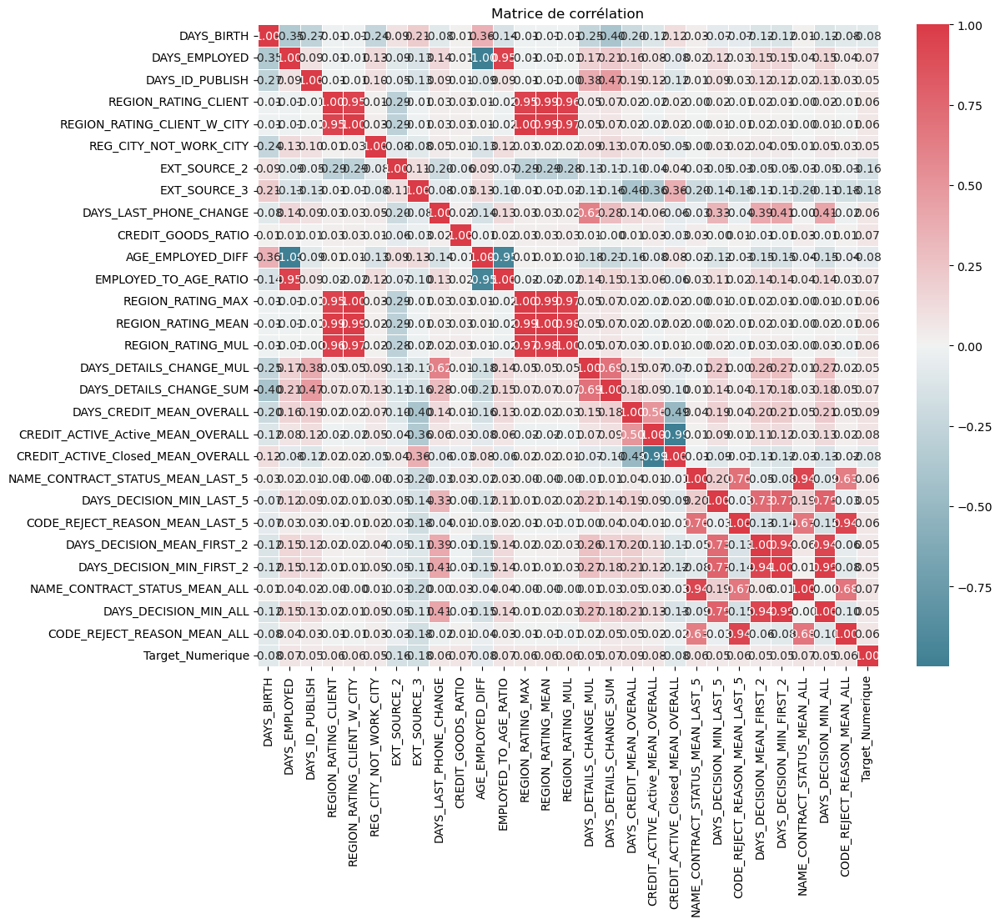

In [24]:
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# Plot
plt.figure(figsize=(12, 10))
sns.heatmap(correlMat, annot=True, cmap=cmap , fmt=".2f", linewidths=0.5)
plt.title("Matrice de corrélation")
plt.show()

In [25]:
# Calculer la matrice de corrélation
correlation_matrix = df_allegé.corr().abs()



In [26]:
correlation_matrix

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,CREDIT_GOODS_RATIO,...,CREDIT_ACTIVE_Closed_MEAN_OVERALL,NAME_CONTRACT_STATUS_MEAN_LAST_5,DAYS_DECISION_MIN_LAST_5,CODE_REJECT_REASON_MEAN_LAST_5,DAYS_DECISION_MEAN_FIRST_2,DAYS_DECISION_MIN_FIRST_2,NAME_CONTRACT_STATUS_MEAN_ALL,DAYS_DECISION_MIN_ALL,CODE_REJECT_REASON_MEAN_ALL,Target_Numerique
DAYS_BIRTH,1.000000,0.352311,0.272689,0.009368,0.008080,0.242408,0.092009,0.205465,0.082945,0.012217,...,0.115924,0.029009,0.065300,0.065335,0.121153,0.121296,0.008842,0.122484,0.078730,0.078242
DAYS_EMPLOYED,0.352311,1.000000,0.089862,0.010731,0.009286,0.128793,0.093463,0.129725,0.141702,0.013366,...,0.076914,0.020848,0.118646,0.029414,0.148774,0.147581,0.036806,0.148474,0.038535,0.074957
DAYS_ID_PUBLISH,0.272689,0.089862,1.000000,0.005101,0.007735,0.099355,0.050957,0.131594,0.088580,0.007001,...,0.115775,0.008256,0.093870,0.026583,0.118734,0.124501,0.021395,0.125607,0.033654,0.051457
REGION_RATING_CLIENT,0.009368,0.010731,0.005101,1.000000,0.950842,0.008363,0.292891,0.012903,0.026017,0.027687,...,0.016341,0.001315,0.016506,0.006016,0.016152,0.014430,0.002176,0.015708,0.007472,0.058901
REGION_RATING_CLIENT_W_CITY,0.008080,0.009286,0.007735,0.950842,1.000000,0.028085,0.288295,0.012157,0.025712,0.025502,...,0.020024,0.001223,0.014613,0.006045,0.015168,0.013026,0.001242,0.014312,0.006854,0.060895
REG_CITY_NOT_WORK_CITY,0.242408,0.128793,0.099355,0.008363,0.028085,1.000000,0.075969,0.079740,0.046789,0.010815,...,0.050401,0.001203,0.027643,0.024374,0.044953,0.046060,0.007194,0.047018,0.029004,0.050992
EXT_SOURCE_2,0.092009,0.093463,0.050957,0.292891,0.288295,0.075969,1.000000,0.109182,0.195763,0.064677,...,0.042287,0.026752,0.050736,0.030520,0.052933,0.053471,0.029492,0.054648,0.031645,0.160471
EXT_SOURCE_3,0.205465,0.129725,0.131594,0.012903,0.012157,0.079740,0.109182,1.000000,0.075255,0.029628,...,0.361249,0.199256,0.142110,0.181726,0.108201,0.110284,0.203991,0.109826,0.178132,0.178926
DAYS_LAST_PHONE_CHANGE,0.082945,0.141702,0.088580,0.026017,0.025712,0.046789,0.195763,0.075255,1.000000,0.019877,...,0.063901,0.032248,0.332970,0.041808,0.393384,0.408780,0.002198,0.411577,0.022864,0.055219
CREDIT_GOODS_RATIO,0.012217,0.013366,0.007001,0.027687,0.025502,0.010815,0.064677,0.029628,0.019877,1.000000,...,0.032552,0.032007,0.000056,0.011933,0.013711,0.010984,0.032620,0.010218,0.012446,0.069434


In [27]:

# Sélectionner la partie triangulaire de la matrice de corrélation
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(np.bool))



C:\Users\najibou\AppData\Local\Temp\ipykernel_21288\1355842635.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(np.bool))


In [28]:
upper

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,CREDIT_GOODS_RATIO,...,CREDIT_ACTIVE_Closed_MEAN_OVERALL,NAME_CONTRACT_STATUS_MEAN_LAST_5,DAYS_DECISION_MIN_LAST_5,CODE_REJECT_REASON_MEAN_LAST_5,DAYS_DECISION_MEAN_FIRST_2,DAYS_DECISION_MIN_FIRST_2,NAME_CONTRACT_STATUS_MEAN_ALL,DAYS_DECISION_MIN_ALL,CODE_REJECT_REASON_MEAN_ALL,Target_Numerique
DAYS_BIRTH,NaN,0.352311,0.272689,0.009368,0.008080,0.242408,0.092009,0.205465,0.082945,0.012217,...,0.115924,0.029009,0.065300,0.065335,0.121153,0.121296,0.008842,0.122484,0.078730,0.078242
DAYS_EMPLOYED,NaN,NaN,0.089862,0.010731,0.009286,0.128793,0.093463,0.129725,0.141702,0.013366,...,0.076914,0.020848,0.118646,0.029414,0.148774,0.147581,0.036806,0.148474,0.038535,0.074957
DAYS_ID_PUBLISH,NaN,NaN,NaN,0.005101,0.007735,0.099355,0.050957,0.131594,0.088580,0.007001,...,0.115775,0.008256,0.093870,0.026583,0.118734,0.124501,0.021395,0.125607,0.033654,0.051457
REGION_RATING_CLIENT,NaN,NaN,NaN,NaN,0.950842,0.008363,0.292891,0.012903,0.026017,0.027687,...,0.016341,0.001315,0.016506,0.006016,0.016152,0.014430,0.002176,0.015708,0.007472,0.058901
REGION_RATING_CLIENT_W_CITY,NaN,NaN,NaN,NaN,NaN,0.028085,0.288295,0.012157,0.025712,0.025502,...,0.020024,0.001223,0.014613,0.006045,0.015168,0.013026,0.001242,0.014312,0.006854,0.060895
REG_CITY_NOT_WORK_CITY,NaN,NaN,NaN,NaN,NaN,NaN,0.075969,0.079740,0.046789,0.010815,...,0.050401,0.001203,0.027643,0.024374,0.044953,0.046060,0.007194,0.047018,0.029004,0.050992
EXT_SOURCE_2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.109182,0.195763,0.064677,...,0.042287,0.026752,0.050736,0.030520,0.052933,0.053471,0.029492,0.054648,0.031645,0.160471
EXT_SOURCE_3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.075255,0.029628,...,0.361249,0.199256,0.142110,0.181726,0.108201,0.110284,0.203991,0.109826,0.178132,0.178926
DAYS_LAST_PHONE_CHANGE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.019877,...,0.063901,0.032248,0.332970,0.041808,0.393384,0.408780,0.002198,0.411577,0.022864,0.055219
CREDIT_GOODS_RATIO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.032552,0.032007,0.000056,0.011933,0.013711,0.010984,0.032620,0.010218,0.012446,0.069434


In [29]:
# Trouver les caractéristiques fortement corrélées
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]



In [30]:
# # Sélectionner la caractéristique la moins corrélée avec la cible parmi les caractéristiques fortement corrélées
# to_drop_final = set()
# for col in to_drop:
#     if correlation['Target_Numerique'].loc[col] < correlation['Target_Numerique'].loc[df_allegé[to_drop].corrwith(df_allegé['Target_Numerique']).idxmin()]:
#         to_drop_final.add(col)

# print("Caractéristiques à supprimer :")
# print(to_drop_final)

AttributeError: 'numpy.float64' object has no attribute 'loc'

In [31]:
print("Caractéristiques à supprimer :")
print(to_drop)

Caractéristiques à supprimer :
['REGION_RATING_CLIENT_W_CITY', 'AGE_EMPLOYED_DIFF', 'EMPLOYED_TO_AGE_RATIO', 'REGION_RATING_MAX', 'REGION_RATING_MEAN', 'REGION_RATING_MUL', 'CREDIT_ACTIVE_Closed_MEAN_OVERALL', 'DAYS_DECISION_MIN_FIRST_2', 'NAME_CONTRACT_STATUS_MEAN_ALL', 'DAYS_DECISION_MIN_ALL', 'CODE_REJECT_REASON_MEAN_ALL']


In [32]:
# on a trop de données on va devoir encore ecrémer, dans un premier temps oocuppons nous des données categorielles

In [33]:
cat = df_allegé.select_dtypes(include = 'object')
cat

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,1,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,0,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,0,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,XNA,XNA,XNA,XNA
3,0,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,XNA,XNA,XNA,XNA
4,0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,XNA,XNA,XNA,XNA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307502,0,Cash loans,M,N,N,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,Sales staff,THURSDAY,Services,reg oper account,block of flats,"Stone, brick",No
307503,0,Cash loans,F,N,Y,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,XNA,MONDAY,XNA,reg oper account,block of flats,"Stone, brick",No
307504,0,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Separated,House / apartment,Managers,THURSDAY,School,reg oper account,block of flats,Panel,No
307505,1,Cash loans,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 1,XNA,block of flats,"Stone, brick",No


In [34]:
# Construct the graph and style it. Further customize your graph by editing this code.
# See Plotly Documentation for help: https://plotly.com/python/plotly-express/
fig = px.histogram(df_allegé, x='NAME_TYPE_SUITE', histfunc='count',color='TARGET',  barmode='group')
 
fig.show()

In [35]:
# Construct the graph and style it. Further customize your graph by editing this code.
# See Plotly Documentation for help: https://plotly.com/python/plotly-express/
fig = px.histogram(df_allegé, x='NAME_FAMILY_STATUS',color='TARGET', histfunc='count',barmode='group')

fig.show(renderer="iframe")

In [36]:

fig = px.histogram(df_allegé, x='NAME_HOUSING_TYPE', histfunc='count',barmode='group',color='TARGET')

fig.show(renderer="iframe")

In [37]:

# Construct the graph and style it. Further customize your graph by editing this code.
# See Plotly Documentation for help: https://plotly.com/python/plotly-express/
fig = px.histogram(df_allegé, x='OCCUPATION_TYPE', histfunc='count',barmode='group',color='TARGET')

fig.show(renderer="iframe")

In [38]:

# Construct the graph and style it. Further customize your graph by editing this code.
# See Plotly Documentation for help: https://plotly.com/python/plotly-express/
fig = px.histogram(df_allegé, x='WEEKDAY_APPR_PROCESS_START', histfunc='count', color='TARGET', barmode='group')

fig.show(renderer="iframe")

In [39]:
# Remplacer 'XNA' par le mode dans les colonnes catégorielles
for col in df_allegé.select_dtypes(include='object').columns:
    if 'XNA' in df_allegé[col].value_counts():
        mode_value = df_allegé[col].mode()[0]  # Sélectionne la valeur la plus fréquente dans la colonne
        if mode_value == 'XNA':
            second_mode_value = df_allegé[col].value_counts().index[1]
            df_allegé[col] = df_allegé[col].replace('XNA', second_mode_value)
        else:
            df_allegé[col] = df_allegé[col].replace('XNA', mode_value)

In [40]:
#remplacer les xna par le mode
# Remplacer 'nan' par le mode dans les colonnes catégorielles
for col in df_allegé.select_dtypes(include='object').columns:
    mode_value = df_allegé[col].mode()[0]
    df_allegé[col] = df_allegé[col].fillna(mode_value)
    

In [41]:

# Construct the graph and style it. Further customize your graph by editing this code.
# See Plotly Documentation for help: https://plotly.com/python/plotly-express/
fig = px.histogram(df_allegé, x='OCCUPATION_TYPE', histfunc='count',barmode='group',color='TARGET')

fig.show(renderer="iframe")

In [42]:
# separaion X y
# Séparer les caractéristiques et la cible
X = df_allegé.drop(['TARGET','Target_Numerique'], axis=1)
y = df_allegé['TARGET']

In [43]:
df_allegé

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,...,CREDIT_ACTIVE_Closed_MEAN_OVERALL,NAME_CONTRACT_STATUS_MEAN_LAST_5,DAYS_DECISION_MIN_LAST_5,CODE_REJECT_REASON_MEAN_LAST_5,DAYS_DECISION_MEAN_FIRST_2,DAYS_DECISION_MIN_FIRST_2,NAME_CONTRACT_STATUS_MEAN_ALL,DAYS_DECISION_MIN_ALL,CODE_REJECT_REASON_MEAN_ALL,Target_Numerique
0,1,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,...,0.750000,0.0,-606.0,1.0,-606.0,-606.0,0.00,-606.0,1.000000,1
1,0,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,...,0.750000,0.0,-2341.0,1.0,-1584.5,-2341.0,0.00,-2341.0,1.000000,0
2,0,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,...,1.000000,0.0,-815.0,1.0,-815.0,-815.0,0.00,-815.0,1.000000,0
3,0,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,...,NaN,1.8,-438.0,1.2,-464.0,-617.0,1.00,-617.0,1.111111,0
4,0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,...,1.000000,0.0,-1768.0,1.0,-2062.5,-2357.0,0.00,-2357.0,1.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307502,0,Cash loans,M,N,N,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,...,NaN,0.0,-273.0,1.0,-273.0,-273.0,0.00,-273.0,1.000000,0
307503,0,Cash loans,F,N,Y,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,...,NaN,0.0,-2497.0,1.0,-2497.0,-2497.0,0.00,-2497.0,1.000000,0
307504,0,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Separated,House / apartment,...,0.500000,0.0,-2851.0,1.0,-2380.0,-2851.0,0.00,-2851.0,1.000000,0
307505,1,Cash loans,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,...,1.000000,0.0,-322.0,1.0,-299.5,-322.0,0.00,-322.0,1.000000,1


In [44]:
# separation colonnes numeriues et categorielles
# Séparer les caractéristiques numériques et catégorielles
numeric_features = [col for col in X.columns if X[col].dtype in ['int64','int32', 'float64']]
categorical_features = [col for col in X.columns if X[col].dtype == 'object']


In [45]:
# Traitement des caractéristiques numériques
numeric_transformer = StandardScaler()
X_numeric = numeric_transformer.fit_transform(X[numeric_features])


In [46]:
# Traitement des caractéristiques catégorielles
binary_categorical_features = [col for col in categorical_features if X[col].nunique() == 2]
multi_categorical_features = [col for col in categorical_features if col not in binary_categorical_features]


In [47]:
# Gestion des caractéristiques binaires
X_binary_categorical = X[binary_categorical_features]
label_encoder = LabelEncoder()
X_binary_categorical = X_binary_categorical.apply(label_encoder.fit_transform)


In [48]:
# Gestion des caractéristiques catégorielles avec plus de 2 catégories
X_multi_categorical = pd.get_dummies(X[multi_categorical_features], drop_first=True)


In [49]:
# Concaténation des caractéristiques prétraitées
X_processed = np.concatenate([X_numeric, X_binary_categorical, X_multi_categorical], axis=1)


In [50]:
# Noms de colonnes pour les caractéristiques prétraitées
processed_feature_names = numeric_features + list(X_binary_categorical.columns) + list(X_multi_categorical.columns)


In [51]:
# Gestion des NaN pour les valeurs numériques
X_processed = np.nan_to_num(X_processed)


In [52]:
X_processed

array([[-1.5068892 ,  0.74717746,  0.57915164, ...,  0.        ,
         1.        ,  0.        ],
       [ 0.16681413,  0.5115385 ,  1.79084957, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.68950269,  0.9233721 ,  0.30686742, ...,  1.        ,
         0.        ,  0.        ],
       ...,
       [-0.24542469, -2.36787547, -1.42819922, ...,  1.        ,
         0.        ,  0.        ],
       [-0.93401703, -1.02717106,  1.36685467, ...,  0.        ,
         1.        ,  0.        ],
       [ 0.18766667,  0.47989189,  1.71201302, ...,  1.        ,
         0.        ,  0.        ]])

In [53]:
# Appliquer l'analyse en composantes principales (PCA)
pca = PCA()
pca.fit(X_processed)
explained_variance = pca.explained_variance_ratio_

# Trouver le nombre optimal de composantes principales
cumulative_variance = np.cumsum(explained_variance)
n_components = np.argmax(cumulative_variance >= 0.95) + 1

In [54]:
# redui encre

In [55]:
# Appliquer PCA avec le nombre optimal de composantes
pca = PCA(n_components=n_components)
pca.fit(X_processed)
pca_X = pca.transform(X_processed)


In [56]:
# Créer un nouveau DataFrame avec les composantes principales
pca_df = pd.DataFrame(data=pca_X, columns=[f'PC{i}' for i in range(1, n_components+1)])
pca_df['TARGET'] = df_allegé['TARGET']

In [57]:
print("DataFrame avec les composantes principales:")
print(pca_df.head())

DataFrame avec les composantes principales:
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -0.617481 -2.420105 -1.129838 -0.840663 -0.541426 -0.021360 -0.360992   
1  4.354729 -0.720305 -0.909674 -2.410142  0.164139 -2.094968  0.879790   
2 -0.063218 -1.247044 -1.798834 -0.347859 -2.310443 -0.650011 -0.008653   
3  0.050931 -1.236534 -0.112685  2.120916 -0.556110  0.654911  0.161208   
4  0.431360  1.741194 -1.194498 -1.066535 -0.531649 -1.350471 -0.436205   

        PC8       PC9      PC10  ...      PC30      PC31      PC32      PC33  \
0  0.539298  0.317091  2.328690  ...  0.550904 -0.010230 -0.195282 -0.252001   
1 -0.669129  1.090238  0.354456  ...  0.008238  0.929981 -0.370213 -0.335495   
2 -1.107535 -0.074639  0.285688  ... -0.231230  0.139813 -0.167461 -0.038973   
3 -0.717478  0.212882 -0.258421  ...  0.035509 -0.185179 -0.077238 -0.161048   
4  0.750486 -1.989468 -0.047252  ...  0.706059  0.434927 -0.263320 -0.118155   

       PC34      PC35   

In [58]:
# Afficher la variance expliquée cumulée
print("Variance expliquée cumulée :")
print(cumulative_variance)

Variance expliquée cumulée :
[0.15874149 0.29576507 0.39702469 0.47382745 0.53820823 0.59726434
 0.63498415 0.66765377 0.6974047  0.72261379 0.74605382 0.76588564
 0.78405114 0.7992534  0.81363998 0.8258225  0.83647137 0.84661413
 0.85656951 0.86556319 0.87375719 0.88164908 0.88882152 0.89543094
 0.90151611 0.90693266 0.91230625 0.91754033 0.92269152 0.92717527
 0.93137683 0.93510823 0.93867178 0.94187839 0.94478155 0.9476185
 0.94997638 0.95229816 0.95457366 0.95679009 0.9588882  0.96081087
 0.96273134 0.96456893 0.96632949 0.96798942 0.96962207 0.9711724
 0.97270365 0.97409676 0.97539347 0.9766715  0.97782539 0.97884933
 0.97982698 0.98077149 0.98165633 0.98245024 0.98321421 0.98391673
 0.98459547 0.98525614 0.98590093 0.98653873 0.98715094 0.98773363
 0.98830385 0.98885408 0.98936371 0.9898396  0.99029815 0.99069559
 0.99108487 0.99146319 0.99180198 0.9921383  0.9924602  0.99277909
 0.99308863 0.9933743  0.99365836 0.99391685 0.99416677 0.9944116
 0.99465531 0.99488468 0.99511208 0.

In [59]:
# Afficher le nombre optimal de composantes principales
print(f"Nombre optimal de composantes principales : {n_components}")

# Afficher la variance expliquée par chaque composante principale
print("Variance expliquée par chaque composante principale :")
for i in range(n_components):
    print(f"PC{i+1}: {explained_variance[i]}")

Nombre optimal de composantes principales : 38
Variance expliquée par chaque composante principale :
PC1: 0.15874149066094603
PC2: 0.13702357615291919
PC3: 0.10125962227798475
PC4: 0.07680275646300387
PC5: 0.06438078814332186
PC6: 0.0590561096818041
PC7: 0.0377198023061113
PC8: 0.032669625090528426
PC9: 0.02975093152843893
PC10: 0.025209088082449108
PC11: 0.02344002613733267
PC12: 0.019831821679510527
PC13: 0.01816550563096759
PC14: 0.01520225926862937
PC15: 0.014386579233207405
PC16: 0.012182515120211339
PC17: 0.010648871137674468
PC18: 0.010142760537764714
PC19: 0.009955379080445421
PC20: 0.008993677294213041
PC21: 0.008194008681420875
PC22: 0.0078918813922225
PC23: 0.007172442458260385
PC24: 0.006609420971114025
PC25: 0.006085168414951452
PC26: 0.0054165564548936335
PC27: 0.005373583212723293
PC28: 0.005234083486538041
PC29: 0.005151188579993609
PC30: 0.004483752120453401
PC31: 0.0042015551209578375
PC32: 0.003731408025286375
PC33: 0.0035635450091780116
PC34: 0.003206610427400108
PC

In [60]:
# Afficher le DataFrame avec les composantes principales
print("\nDataFrame avec les composantes principales :")
print(pca_df.head())


DataFrame avec les composantes principales :
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -0.617481 -2.420105 -1.129838 -0.840663 -0.541426 -0.021360 -0.360992   
1  4.354729 -0.720305 -0.909674 -2.410142  0.164139 -2.094968  0.879790   
2 -0.063218 -1.247044 -1.798834 -0.347859 -2.310443 -0.650011 -0.008653   
3  0.050931 -1.236534 -0.112685  2.120916 -0.556110  0.654911  0.161208   
4  0.431360  1.741194 -1.194498 -1.066535 -0.531649 -1.350471 -0.436205   

        PC8       PC9      PC10  ...      PC30      PC31      PC32      PC33  \
0  0.539298  0.317091  2.328690  ...  0.550904 -0.010230 -0.195282 -0.252001   
1 -0.669129  1.090238  0.354456  ...  0.008238  0.929981 -0.370213 -0.335495   
2 -1.107535 -0.074639  0.285688  ... -0.231230  0.139813 -0.167461 -0.038973   
3 -0.717478  0.212882 -0.258421  ...  0.035509 -0.185179 -0.077238 -0.161048   
4  0.750486 -1.989468 -0.047252  ...  0.706059  0.434927 -0.263320 -0.118155   

       PC34      PC35 

<AxesSubplot:>

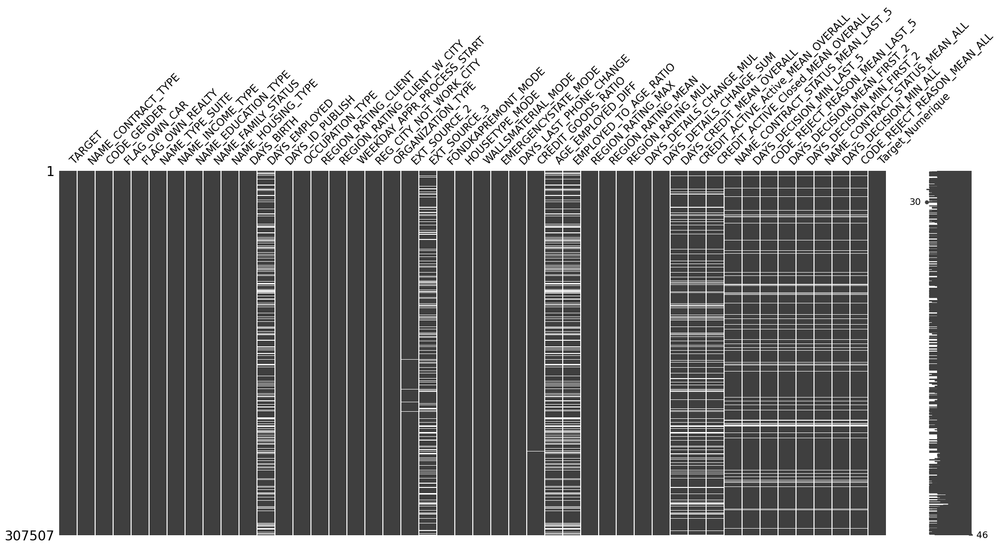

In [61]:
msno.matrix(df_allegé)

Variance expliquée cumulée :
[0.15874149 0.29576507 0.39702469 0.47382745 0.53820823 0.59726434
 0.63498415 0.66765377 0.6974047  0.72261379 0.74605382 0.76588564
 0.78405114 0.7992534  0.81363998 0.8258225  0.83647137 0.84661413
 0.85656951 0.86556319 0.87375719 0.88164908 0.88882152 0.89543094
 0.90151611 0.90693266 0.91230625 0.91754033 0.92269152 0.92717527
 0.93137683 0.93510823 0.93867178 0.94187839 0.94478155 0.9476185
 0.94997638 0.95229816 0.95457366 0.95679009 0.9588882  0.96081087
 0.96273134 0.96456893 0.96632949 0.96798942 0.96962207 0.9711724
 0.97270365 0.97409676 0.97539347 0.9766715  0.97782539 0.97884933
 0.97982698 0.98077149 0.98165633 0.98245024 0.98321421 0.98391673
 0.98459547 0.98525614 0.98590093 0.98653873 0.98715094 0.98773363
 0.98830385 0.98885408 0.98936371 0.9898396  0.99029815 0.99069559
 0.99108487 0.99146319 0.99180198 0.9921383  0.9924602  0.99277909
 0.99308863 0.9933743  0.99365836 0.99391685 0.99416677 0.9944116
 0.99465531 0.99488468 0.99511208 0.

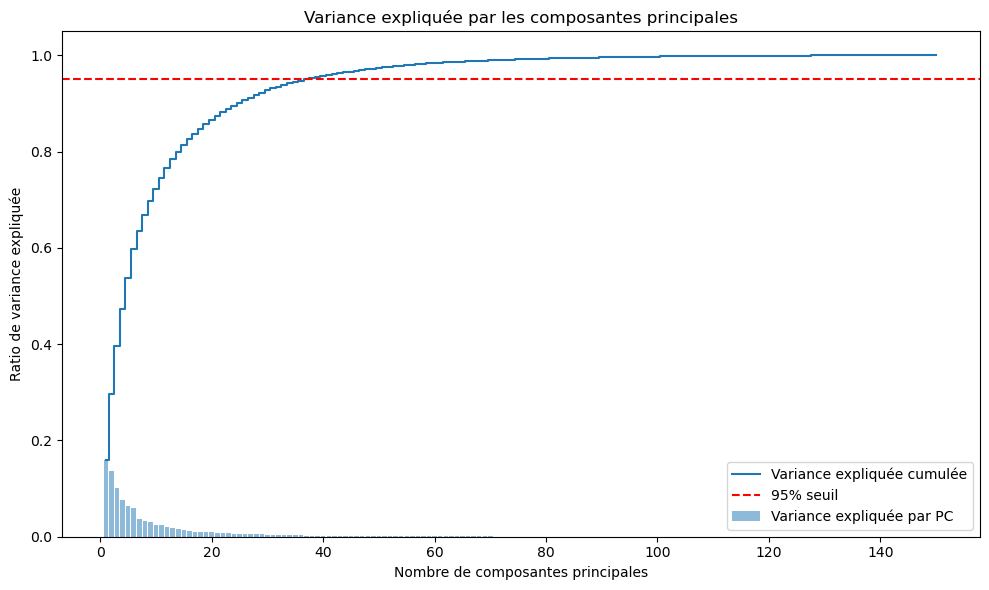


Contribution de chaque feature à l'explicabilité de la cible :
Feature 1: 0.04884143227601001
Feature 2: -0.03551799801722377
Feature 3: -0.040055517428881374
Feature 4: -0.4202442829358223
Feature 5: -0.42475730201305056
Feature 6: -0.03236232080065324
Feature 7: 0.1713672669295408
Feature 8: 0.0336942769789026
Feature 9: -0.08134593851759521
Feature 10: -0.018361305270105106
Feature 11: 0.03568220326915479
Feature 12: -0.027131797067238027
Feature 13: -0.4247573020130506
Feature 14: -0.4277764456809123
Feature 15: -0.42308551120780646
Feature 16: -0.09361241779568363
Feature 17: -0.09342328447590938
Feature 18: -0.049330052478304125
Feature 19: -0.021806612316825468
Feature 20: 0.02162605578003688
Feature 21: -0.00041723262470521623
Feature 22: -0.07966919631271085
Feature 23: 0.00713312416287677
Feature 24: -0.08958248144370211
Feature 25: -0.09107274705984253
Feature 26: -0.007703580336143583
Feature 27: -0.09186062333645852
Feature 28: 0.003270351370341091
Feature 29: -0.00042033

In [62]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Appliquer l'analyse en composantes principales (PCA)
pca = PCA()
pca.fit(X_processed)
explained_variance = pca.explained_variance_ratio_

# Trouver le nombre optimal de composantes principales
cumulative_variance = np.cumsum(explained_variance)
n_components = np.argmax(cumulative_variance >= 0.95) + 1

# Appliquer PCA avec le nombre optimal de composantes
pca = PCA(n_components=n_components)
pca.fit(X_processed)
pca_X = pca.transform(X_processed)

# Créer un nouveau DataFrame avec les composantes principales
pca_df = pd.DataFrame(data=pca_X, columns=[f'PC{i}' for i in range(1, n_components+1)])
pca_df['TARGET'] = df_allegé['TARGET']

# Afficher la variance expliquée cumulée
print("Variance expliquée cumulée :")
print(cumulative_variance)

# Afficher le nombre optimal de composantes principales
print(f"Nombre optimal de composantes principales : {n_components}")

# Afficher la variance expliquée par chaque composante principale
print("Variance expliquée par chaque composante principale :")
for i in range(n_components):
    print(f"PC{i+1}: {explained_variance[i]}")

# Afficher le DataFrame avec les composantes principales
print("\nDataFrame avec les composantes principales :")
print(pca_df.head())

# Plot variance expliquée
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.5, align='center', label='Variance expliquée par PC')
plt.step(range(1, len(explained_variance) + 1), cumulative_variance, where='mid', label='Variance expliquée cumulée')
plt.ylabel('Ratio de variance expliquée')
plt.xlabel('Nombre de composantes principales')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% seuil')
plt.title('Variance expliquée par les composantes principales')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

# Afficher la contribution de chaque feature à l'explicabilité de la cible
print("\nContribution de chaque feature à l'explicabilité de la cible :")
for i, col in enumerate(range(X_processed.shape[1])):
    print(f"Feature {i+1}: {pca.components_[0][i]}")


Variance expliquée cumulée :
[0.15874149 0.29576507 0.39702469 0.47382745 0.53820823 0.59726434
 0.63498415 0.66765377 0.6974047  0.72261379 0.74605382 0.76588564
 0.78405114 0.7992534  0.81363998 0.8258225  0.83647137 0.84661413
 0.85656951 0.86556319 0.87375719 0.88164908 0.88882152 0.89543094
 0.90151611 0.90693266 0.91230625 0.91754033 0.92269152 0.92717527
 0.93137683 0.93510823 0.93867178 0.94187839 0.94478155 0.9476185
 0.94997638 0.95229816 0.95457366 0.95679009 0.9588882  0.96081087
 0.96273134 0.96456893 0.96632949 0.96798942 0.96962207 0.9711724
 0.97270365 0.97409676 0.97539347 0.9766715  0.97782539 0.97884933
 0.97982698 0.98077149 0.98165633 0.98245024 0.98321421 0.98391673
 0.98459547 0.98525614 0.98590093 0.98653873 0.98715094 0.98773363
 0.98830385 0.98885408 0.98936371 0.9898396  0.99029815 0.99069559
 0.99108487 0.99146319 0.99180198 0.9921383  0.9924602  0.99277909
 0.99308863 0.9933743  0.99365836 0.99391685 0.99416677 0.9944116
 0.99465531 0.99488468 0.99511208 0.

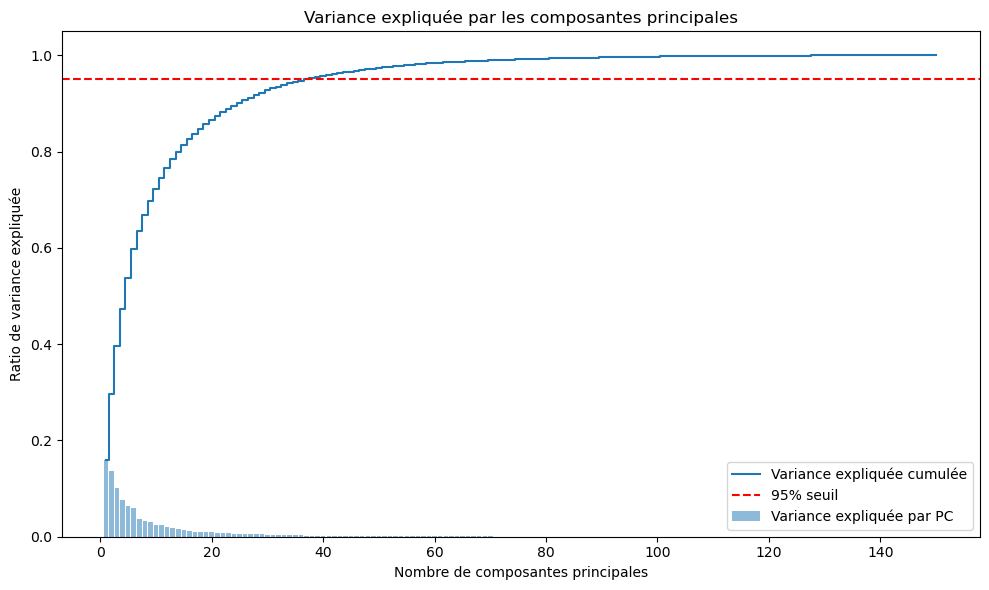


Contribution de chaque feature à l'explicabilité de la cible :
TARGET: 0.04884143227872828
NAME_CONTRACT_TYPE: -0.03551799802204458
CODE_GENDER: -0.040055517430138105
FLAG_OWN_CAR: -0.4202442829219764
FLAG_OWN_REALTY: -0.42475730202001016
NAME_TYPE_SUITE: -0.0323623208017051
NAME_INCOME_TYPE: 0.17136726692873616
NAME_EDUCATION_TYPE: 0.0336942769792434
NAME_FAMILY_STATUS: -0.08134593851720627
NAME_HOUSING_TYPE: -0.01836130527000189
DAYS_BIRTH: 0.035682203274207513
DAYS_EMPLOYED: -0.02713179705598482
DAYS_ID_PUBLISH: -0.4247573020200102
OCCUPATION_TYPE: -0.4277764456773671
REGION_RATING_CLIENT: -0.4230855112113596
REGION_RATING_CLIENT_W_CITY: -0.09361241779598188
WEEKDAY_APPR_PROCESS_START: -0.09342328447623165
REG_CITY_NOT_WORK_CITY: -0.049330052477500046
ORGANIZATION_TYPE: -0.021806612316578364
EXT_SOURCE_2: 0.021626055780130625
EXT_SOURCE_3: -0.0004172326027399141
FONDKAPREMONT_MODE: -0.07966919632354243
HOUSETYPE_MODE: 0.007133124188948521
WALLSMATERIAL_MODE: -0.08958248143623827
EM

In [63]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Appliquer l'analyse en composantes principales (PCA)
pca = PCA()
pca.fit(X_processed)
explained_variance = pca.explained_variance_ratio_

# Trouver le nombre optimal de composantes principales
cumulative_variance = np.cumsum(explained_variance)
n_components = np.argmax(cumulative_variance >= 0.95) + 1

# Appliquer PCA avec le nombre optimal de composantes principales
pca = PCA(n_components=n_components)
pca.fit(X_processed)
pca_X = pca.transform(X_processed)

# Créer un nouveau DataFrame avec les composantes principales
pca_df = pd.DataFrame(data=pca_X, columns=[f'PC{i}' for i in range(1, n_components+1)])
pca_df['TARGET'] = df_allegé['TARGET']

# Afficher la variance expliquée cumulée
print("Variance expliquée cumulée :")
print(cumulative_variance)

# Afficher le nombre optimal de composantes principales
print(f"Nombre optimal de composantes principales : {n_components}")

# Afficher la variance expliquée par chaque composante principale
print("Variance expliquée par chaque composante principale :")
for i in range(n_components):
    print(f"PC{i+1}: {explained_variance[i]}")

# Afficher le DataFrame avec les composantes principales
print("\nDataFrame avec les composantes principales :")
print(pca_df.head())

# Plot variance expliquée
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.5, align='center', label='Variance expliquée par PC')
plt.step(range(1, len(explained_variance) + 1), cumulative_variance, where='mid', label='Variance expliquée cumulée')
plt.ylabel('Ratio de variance expliquée')
plt.xlabel('Nombre de composantes principales')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% seuil')
plt.title('Variance expliquée par les composantes principales')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

# Afficher la contribution de chaque feature à l'explicabilité de la cible
print("\nContribution de chaque feature à l'explicabilité de la cible :")
for i, col in enumerate(df_allegé.columns[:-1]):
    print(f"{col}: {pca.components_[0][i]}")


Variance expliquée cumulée :
[0.15874149 0.29576507 0.39702469 0.47382745 0.53820823 0.59726434
 0.63498415 0.66765377 0.6974047  0.72261379 0.74605382 0.76588564
 0.78405114 0.7992534  0.81363998 0.8258225  0.83647137 0.84661413
 0.85656951 0.86556319 0.87375719 0.88164908 0.88882152 0.89543094
 0.90151611 0.90693266 0.91230625 0.91754033 0.92269152 0.92717527
 0.93137683 0.93510823 0.93867178 0.94187839 0.94478155 0.9476185
 0.94997638 0.95229816 0.95457366 0.95679009 0.9588882  0.96081087
 0.96273134 0.96456893 0.96632949 0.96798942 0.96962207 0.9711724
 0.97270365 0.97409676 0.97539347 0.9766715  0.97782539 0.97884933
 0.97982698 0.98077149 0.98165633 0.98245024 0.98321421 0.98391673
 0.98459547 0.98525614 0.98590093 0.98653873 0.98715094 0.98773363
 0.98830385 0.98885408 0.98936371 0.9898396  0.99029815 0.99069559
 0.99108487 0.99146319 0.99180198 0.9921383  0.9924602  0.99277909
 0.99308863 0.9933743  0.99365836 0.99391685 0.99416677 0.9944116
 0.99465531 0.99488468 0.99511208 0.

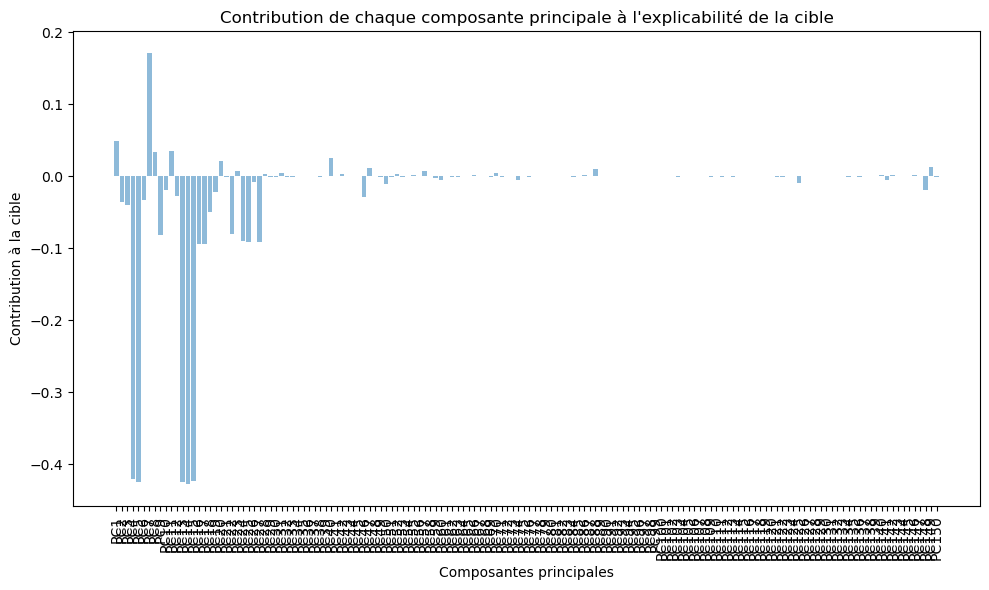

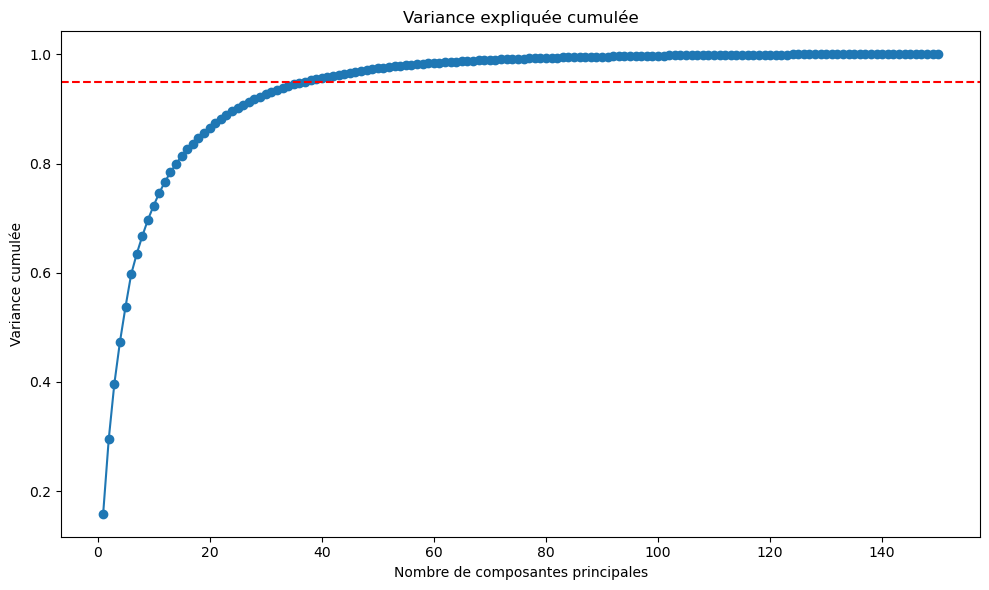

In [64]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Appliquer l'analyse en composantes principales (PCA)
pca = PCA()
pca.fit(X_processed)
explained_variance = pca.explained_variance_ratio_

# Trouver le nombre optimal de composantes principales
cumulative_variance = np.cumsum(explained_variance)
n_components = np.argmax(cumulative_variance >= 0.95) + 1

# Appliquer PCA avec le nombre optimal de composantes principales
pca = PCA(n_components=n_components)
pca.fit(X_processed)
pca_X = pca.transform(X_processed)

# Créer un nouveau DataFrame avec les composantes principales
pca_df = pd.DataFrame(data=pca_X, columns=[f'PC{i}' for i in range(1, n_components+1)])
pca_df['TARGET'] = df_allegé['TARGET']

# Afficher la variance expliquée cumulée
print("Variance expliquée cumulée :")
print(cumulative_variance)

# Afficher le nombre optimal de composantes principales
print(f"Nombre optimal de composantes principales : {n_components}")

# Afficher la variance expliquée par chaque composante principale
print("Variance expliquée par chaque composante principale :")
for i in range(n_components):
    print(f"PC{i+1}: {explained_variance[i]}")

# Afficher le DataFrame avec les composantes principales
print("\nDataFrame avec les composantes principales :")
print(pca_df.head())

# Plot de la contribution de chaque feature à l'explicabilité de la cible
plt.figure(figsize=(10, 6))
plt.bar(range(len(pca.components_[0])), pca.components_[0], alpha=0.5)
plt.xticks(range(len(pca.components_[0])), [f'PC{i+1}' for i in range(len(pca.components_[0]))], rotation=90)
plt.xlabel('Composantes principales')
plt.ylabel('Contribution à la cible')
plt.title("Contribution de chaque composante principale à l'explicabilité de la cible")
plt.tight_layout()
plt.show()

# Plot de la variance expliquée cumulée
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, marker='o', linestyle='-')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Variance cumulée')
plt.title('Variance expliquée cumulée')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% seuil')
plt.tight_layout()
plt.show()


In [66]:
# from sklearn.decomposition import PCA
# import seaborn as sns
# import numpy as np
# import matplotlib.pyplot as plt

 
# n_components = 4
 
# # Do the PCA.
# pca = PCA(n_components=n_components)
# reduced = pca.fit_transform(df_allegé[[
# 'NAME_CONTRACT_TYPE',
# 'CODE_GENDER',
# 'FLAG_OWN_CAR',
# 'FLAG_OWN_REALTY',
# 'NAME_TYPE_SUITE',
# 'NAME_INCOME_TYPE',
# 'NAME_EDUCATION_TYPE',
# 'NAME_FAMILY_STATUS',
# 'NAME_HOUSING_TYPE',
# 'DAYS_BIRTH',
# 'DAYS_EMPLOYED',
# 'DAYS_ID_PUBLISH',
# # 'OCCUPATION_TYPE',
# 'REGION_RATING_CLIENT',
# 'REGION_RATING_CLIENT_W_CITY',
# 'WEEKDAY_APPR_PROCESS_START',
# 'REG_CITY_NOT_WORK_CITY',
# 'ORGANIZATION_TYPE',
# 'EXT_SOURCE_2',
# 'EXT_SOURCE_3',
# 'FONDKAPREMONT_MODE',
# 'HOUSETYPE_MODE',
# 'WALLSMATERIAL_MODE',
# 'EMERGENCYSTATE_MODE',
# 'DAYS_LAST_PHONE_CHANGE',
# 'CREDIT_GOODS_RATIO',
# 'AGE_EMPLOYED_DIFF',
# 'EMPLOYED_TO_AGE_RATIO',
# 'REGION_RATING_MAX',
# 'REGION_RATING_MEAN',
# 'REGION_RATING_MUL',
# 'DAYS_DETAILS_CHANGE_MUL',
# 'DAYS_DETAILS_CHANGE_SUM',
# 'DAYS_CREDIT_MEAN_OVERALL',
# 'CREDIT_ACTIVE_Active_MEAN_OVERALL',
# 'CREDIT_ACTIVE_Closed_MEAN_OVERALL',
# 'NAME_CONTRACT_STATUS_MEAN_LAST_5',
# 'DAYS_DECISION_MIN_LAST_5',
# 'CODE_REJECT_REASON_MEAN_LAST_5',
# 'DAYS_DECISION_MEAN_FIRST_2',
# 'DAYS_DECISION_MIN_FIRST_2',
# 'NAME_CONTRACT_STATUS_MEAN_ALL',
# 'DAYS_DECISION_MIN_ALL',
# 'CODE_REJECT_REASON_MEAN_ALL'
# ]])

# # Append the principle components for each entry to the dataframe
# for i in range(0, n_components):
#     df['PC' + str(i + 1)] = reduced[:, i]

# display(df.head())

# # Do a scree plot
# ind = np.arange(0, n_components)
# (fig, ax) = plt.subplots(figsize=(8, 6))
# sns.pointplot(x=ind, y=pca.explained_variance_ratio_)
# ax.set_title('Scree plot')
# ax.set_xticks(ind)
# ax.set_xticklabels(ind)
# ax.set_xlabel('Component Number')
# ax.set_ylabel('Explained Variance')
# plt.show()

# # Show the points in terms of the first two PCs
# g = sns.lmplot('PC1',
#                'PC2',
#                hue='species',data=df,
#                fit_reg=False,
#                scatter=True,
#                size=7)

# plt.show()

# # Plot a variable factor map for the first two dimensions.
# (fig, ax) = plt.subplots(figsize=(8, 8))
# for i in range(0, pca.components_.shape[1]):
#     ax.arrow(0,
#              0,  # Start the arrow at the origin
#              pca.components_[0, i],  #0 for PC1
#              pca.components_[1, i],  #1 for PC2
#              head_width=0.1,
#              head_length=0.1)

#     plt.text(pca.components_[0, i] + 0.05,
#              pca.components_[1, i] + 0.05,
#              df.columns.values[i])


# an = np.linspace(0, 2 * np.pi, 100)
# plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
# plt.axis('equal')
# ax.set_title('Variable factor map')
# plt.show()

In [67]:
for col in df_allegé:
    print(col)

TARGET
NAME_CONTRACT_TYPE
CODE_GENDER
FLAG_OWN_CAR
FLAG_OWN_REALTY
NAME_TYPE_SUITE
NAME_INCOME_TYPE
NAME_EDUCATION_TYPE
NAME_FAMILY_STATUS
NAME_HOUSING_TYPE
DAYS_BIRTH
DAYS_EMPLOYED
DAYS_ID_PUBLISH
OCCUPATION_TYPE
REGION_RATING_CLIENT
REGION_RATING_CLIENT_W_CITY
WEEKDAY_APPR_PROCESS_START
REG_CITY_NOT_WORK_CITY
ORGANIZATION_TYPE
EXT_SOURCE_2
EXT_SOURCE_3
FONDKAPREMONT_MODE
HOUSETYPE_MODE
WALLSMATERIAL_MODE
EMERGENCYSTATE_MODE
DAYS_LAST_PHONE_CHANGE
CREDIT_GOODS_RATIO
AGE_EMPLOYED_DIFF
EMPLOYED_TO_AGE_RATIO
REGION_RATING_MAX
REGION_RATING_MEAN
REGION_RATING_MUL
DAYS_DETAILS_CHANGE_MUL
DAYS_DETAILS_CHANGE_SUM
DAYS_CREDIT_MEAN_OVERALL
CREDIT_ACTIVE_Active_MEAN_OVERALL
CREDIT_ACTIVE_Closed_MEAN_OVERALL
NAME_CONTRACT_STATUS_MEAN_LAST_5
DAYS_DECISION_MIN_LAST_5
CODE_REJECT_REASON_MEAN_LAST_5
DAYS_DECISION_MEAN_FIRST_2
DAYS_DECISION_MIN_FIRST_2
NAME_CONTRACT_STATUS_MEAN_ALL
DAYS_DECISION_MIN_ALL
CODE_REJECT_REASON_MEAN_ALL
Target_Numerique


In [68]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.2, random_state=42)

# Appliquer PCA sur l'ensemble d'entraînement
pca = PCA()
X_train_pca = pca.fit_transform(X_train)

# Créer un modèle de régression logistique
model = LogisticRegression()

# Entraîner le modèle
model.fit(X_train_pca, y_train)

# Appliquer la même transformation PCA sur l'ensemble de test
X_test_pca = pca.transform(X_test)

# Prédire sur l'ensemble de test
y_pred = model.predict(X_test_pca)

# Évaluer le modèle
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.9185392344964391

Classification Report:
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     56481
           1       0.54      0.02      0.03      5021

    accuracy                           0.92     61502
   macro avg       0.73      0.51      0.49     61502
weighted avg       0.89      0.92      0.88     61502



In [69]:
plot_matrix(y_test, y_pred)

[[56412    69]
 [ 4941    80]]


In [70]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek
from sklearn.base import clone

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.2, random_state=42)

# Random Undersampling
rus = RandomUnderSampler(random_state=42)
X_rus, y_rus = rus.fit_resample(X_train, y_train)

# SMOTETomek
smt = SMOTETomek(random_state=42)
X_smt, y_smt = smt.fit_resample(X_train, y_train)

# Appliquer PCA sur l'ensemble d'entraînement après Random Undersampling
pca = PCA()
X_train_rus_pca = pca.fit_transform(X_rus)

# Appliquer PCA sur l'ensemble d'entraînement après SMOTETomek
pca = PCA()
X_train_smt_pca = pca.fit_transform(X_smt)

# Appliquer PCA sur l'ensemble de test
pca = PCA()
X_test_pca = pca.fit_transform(X_test)

# Créer un modèle de régression logistique
model = LogisticRegression()

# Créer un clone du modèle de régression logistique de base pour Random Undersampling
model_rus = clone(model)

# Créer un clone du modèle de régression logistique de base pour SMOTETomek
model_smt = clone(model)

# Entraîner le modèle sur les données sous-échantillonnées
model_rus.fit(X_train_rus_pca, y_rus)

# Entraîner le modèle sur les données sur-échantillonnées
model_smt.fit(X_train_smt_pca, y_smt)

# Prédire sur l'ensemble de test pour Random Undersampling
y_pred_rus = model_rus.predict(X_test_pca)

# Prédire sur l'ensemble de test pour SMOTETomek
y_pred_smt = model_smt.predict(X_test_pca)

# Évaluer le modèle pour Random Undersampling
accuracy_rus = accuracy_score(y_test, y_pred_rus)
print("\nAccuracy avec Random Undersampling:", accuracy_rus)
print("\nClassification Report avec Random Undersampling:\n", classification_report(y_test, y_pred_rus))

# Évaluer le modèle pour SMOTETomek
accuracy_smt = accuracy_score(y_test, y_pred_smt)
print("\nAccuracy avec SMOTETomek:", accuracy_smt)
print("\nClassification Report avec SMOTETomek:\n", classification_report(y_test, y_pred_smt))


C:\Users\najibou\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression




Accuracy avec Random Undersampling: 0.5254951058502163

Classification Report avec Random Undersampling:
               precision    recall  f1-score   support

           0       0.95      0.51      0.66     56481
           1       0.12      0.72      0.20      5021

    accuracy                           0.53     61502
   macro avg       0.53      0.62      0.43     61502
weighted avg       0.89      0.53      0.63     61502


Accuracy avec SMOTETomek: 0.5362264641800266

Classification Report avec SMOTETomek:
               precision    recall  f1-score   support

           0       0.95      0.52      0.67     56481
           1       0.12      0.71      0.20      5021

    accuracy                           0.54     61502
   macro avg       0.53      0.62      0.44     61502
weighted avg       0.88      0.54      0.63     61502



C:\Users\najibou\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [71]:
plot_matrix(y_test, y_pred_rus)
plot_matrix(y_test, y_pred_smt)

[[28693 27788]
 [ 1395  3626]]
[[29414 27067]
 [ 1456  3565]]


In [74]:
from imblearn.over_sampling import SMOTE

# Random Undersampling
smote = SMOTE(random_state=42)
X_SMOTE, y_SMOTE = smote.fit_resample(X_train, y_train)

# Appliquer PCA sur l'ensemble d'entraînement après SMOTETomek
pca = PCA()
X_train_SMOTE_pca = pca.fit_transform(X_SMOTE)

# Créer un clone du modèle de régression logistique de base pour Random Undersampling
model_SMOTE = clone(model)

# Entraîner le modèle sur les données sur-échantillonnées
model_SMOTE.fit(X_train_SMOTE_pca, y_SMOTE)

# Prédire sur l'ensemble de test pour Random Undersampling
y_pred_SMOTE = model_SMOTE.predict(X_test_pca)

# Évaluer le modèle pour Random Undersampling
accuracy_rus = accuracy_score(y_test, y_pred_SMOTE)
print("\nAccuracy avec Random Undersampling:", accuracy_rus)
print("\nClassification Report avec Random Undersampling:\n", classification_report(y_test, y_pred_SMOTE))

plot_matrix(y_test, y_pred_SMOTE)


Accuracy avec Random Undersampling: 0.5362752430815259

Classification Report avec Random Undersampling:
               precision    recall  f1-score   support

           0       0.95      0.52      0.67     56481
           1       0.12      0.71      0.20      5021

    accuracy                           0.54     61502
   macro avg       0.53      0.62      0.44     61502
weighted avg       0.88      0.54      0.63     61502

[[29418 27063]
 [ 1457  3564]]


C:\Users\najibou\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [75]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(pca_df.drop(columns=['TARGET']), pca_df['TARGET'], test_size=0.2, random_state=42)

# Appliquer SMOTE sur l'ensemble d'entraînement
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Créer un modèle XGBoost
model = XGBClassifier()

# Définir la grille des hyperparamètres
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.05, 0.1, 0.2]
}

# Recherche par grille des hyperparamètres
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1)
grid_search.fit(X_train_resampled, y_train_resampled)

# Afficher les meilleurs hyperparamètres
print("Meilleurs Hyperparamètres:", grid_search.best_params_)

# Entraîner le modèle avec les meilleurs hyperparamètres
best_model = grid_search.best_estimator_
best_model.fit(X_train_resampled, y_train_resampled)

# Prédire sur l'ensemble de test
y_pred = best_model.predict(X_test)

# Évaluer le modèle
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Fitting 5 folds for each of 27 candidates, totalling 135 fits
Meilleurs Hyperparamètres: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200}
Accuracy: 0.8766218984748464

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.93      0.93     56481
           1       0.23      0.22      0.23      5021

    accuracy                           0.88     61502
   macro avg       0.58      0.58      0.58     61502
weighted avg       0.87      0.88      0.88     61502



In [76]:
plot_matrix(y_test,y_pred)

[[52787  3694]
 [ 3894  1127]]


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import RandomUnderSampler
from xgboost import XGBClassifier
from sklearn.metrics import classification_report

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_processed, df_allegé['TARGET'], test_size=0.2, random_state=42)

# Appliquer SMOTE + Tomek links
smt = SMOTETomek(random_state=42)
X_train_smote_tomek, y_train_smote_tomek = smt.fit_resample(X_train, y_train)

# Appliquer SMOTE
sm = SMOTE(random_state=42)
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)

# Appliquer RandomUnderSampler
rus = RandomUnderSampler(random_state=42)
X_train_under, y_train_under = rus.fit_resample(X_train, y_train)

# Créer le classifieur XGBoost
xgb = XGBClassifier()

# Définir la grille des hyperparamètres
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.1, 0.01, 0.001, 0.0001],
    'subsample': [0.5, 0.7, 0.9],
    'colsample_bytree': [0.5, 0.7, 0.9],
    'gamma': [0, 0.1, 0.2, 0.3],
    'reg_alpha': [0, 0.1, 0.5, 1],
    'reg_lambda': [0, 1, 1.5, 2],
    'min_child_weight': [1, 5, 10]
}

skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Recherche des meilleurs hyperparamètres
grid_xgb_smote_tomek = GridSearchCV(xgb, param_grid, scoring='accuracy', cv=skf)
grid_xgb_smote = GridSearchCV(xgb, param_grid, scoring='accuracy', cv=skf)
grid_xgb_under = GridSearchCV(xgb, param_grid, scoring='accuracy', cv=skf)

# Entraîner le modèle avec SMOTE + Tomek links
grid_xgb_smote_tomek.fit(X_train_smote_tomek, y_train_smote_tomek)

# Entraîner le modèle avec SMOTE
grid_xgb_smote.fit(X_train_smote, y_train_smote)

# Entraîner le modèle avec RandomUnderSampler
grid_xgb_under.fit(X_train_under, y_train_under)

# Meilleurs hyperparamètres
print("Meilleurs hyperparamètres pour SMOTE + Tomek links:", grid_xgb_smote_tomek.best_params_)
print("Meilleurs hyperparamètres pour SMOTE:", grid_xgb_smote.best_params_)
print("Meilleurs hyperparamètres pour RandomUnderSampler:", grid_xgb_under.best_params_)

# Prédire sur l'ensemble de test
y_pred_xgb_smote_tomek = grid_xgb_smote_tomek.predict(X_test)
y_pred_xgb_smote = grid_xgb_smote.predict(X_test)
y_pred_xgb_under = grid_xgb_under.predict(X_test)

# Évaluer le modèle
print("Rapport de classification pour XGBoost avec SMOTE + Tomek links :\n", classification_report(y_test, y_pred_xgb_smote_tomek))
plot_matrix(y_test,y_pred_xgb_smote_tomek)
print("Rapport de classification pour XGBoost avec SMOTE :\n", classification_report(y_test, y_pred_xgb_smote))
plot_matrix(y_test,y_pred_xgb_smote)
print("Rapport de classification pour XGBoost avec RandomUnderSampler :\n", classification_report(y_test, y_pred_xgb_under))
plot_matrix(y_test,y_pred_xgb_under)

In [ ]:
plot_features_importance(grid_xgb_smote_tomek, X_train_smote_tomek)
plot_features_importance(grid_xgb_smote, X_train_smote)
plot_features_importance(grid_xgb_under, X_train_under)

